<a href="https://colab.research.google.com/github/nagolinc/notebooks/blob/main/ViT_L_14_CLIP_%2B_TADNE_(pytorch)_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Import TADNE and convert to pytorch

In [1]:
!nvidia-smi

Thu Feb 10 09:10:01 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    30W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!git clone https://github.com/shawwn/stylegan2 -b estimator /content/stylegan2
!git clone https://github.com/openai/CLIP
!pip install -e ./CLIP

fatal: destination path '/content/stylegan2' already exists and is not an empty directory.
fatal: destination path 'CLIP' already exists and is not an empty directory.
Obtaining file:///content/CLIP
  Attempting uninstall: clip
    Found existing installation: clip 1.0
    Can't uninstall 'clip'. No files were found to uninstall.
  Running setup.py develop for clip


In [3]:
cd /content/

/content


In [4]:
import sys
sys.path.append('./CLIP')
import clip

In [5]:
device='cuda'
_clip_model, clip_preprocess = clip.load('ViT-L/14', jit=False)
clip_model=_clip_model.eval().requires_grad_(False).to(device)

In [6]:
import gdown, os

if not os.path.exists("/content/network-tadne.pkl"):
  #gdown.download('https://drive.google.com/uc?id=1qNhyusI0hwBLI-HOavkNP5I0J0-kcN4C', 'network-tadne.pkl', quiet=False)
  url='https://drive.google.com/uc?id=1LCkyOPmcWBsPlQX_DxKAuPM1Ew_nh83I'
  gdown.download(url, '/content/network-tadne.pkl', quiet=False)


In [7]:
!ls -lrt /content/network-tadne.pkl

-rw------- 1 root root 1056544230 Feb 10 09:06 /content/network-tadne.pkl


In [8]:
%tensorflow_version 1.x
%cd /content/stylegan2

TensorFlow 1.x selected.
/content/stylegan2


In [9]:
import os
import pickle
import numpy as np
import PIL.Image
import dnnlib
import dnnlib.tflib as tflib
import scipy



attach_debugger <function attach_debugger at 0x7f8ae787fb00>
print_status <function print_status at 0x7f8ae787fe60>
freeze_forever <function freeze_forever at 0x7f8ae787fd40>
quit <function quit at 0x7f8ae787fcb0>
save_and_quit <function save_and_quit at 0x7f8ae787ccb0>
throw_exception <function throw_exception at 0x7f8ae787be60>


In [10]:
tflib.init_tf()
_G, _D, Gs = pickle.load(open("/content/network-tadne.pkl", "rb"))
# _G = Instantaneous snapshot of the generator. Mainly useful for resuming a previous training run.
# _D = Instantaneous snapshot of the discriminator. Mainly useful for resuming a previous training run.
# Gs = Long-term average of the generator. Yields higher-quality results than the instantaneous snapshot.

Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.


In [11]:

!git clone https://github.com/nagolinc/stylegan2-pytorch.git /content/stylegan2-pytorch/

fatal: destination path '/content/stylegan2-pytorch' already exists and is not an empty directory.


In [12]:
!cd /content/stylegan2-pytorch/
!git pull

Already up to date.


In [13]:
import subprocess

CUDA_version = [s for s in subprocess.check_output(["nvcc", "--version"]).decode("UTF-8").split(", ") if s.startswith("release")][0].split(" ")[-1]
print("CUDA version:", CUDA_version)

if CUDA_version == "10.0":
    torch_version_suffix = "+cu100"
elif CUDA_version == "10.1":
    torch_version_suffix = "+cu101"
elif CUDA_version == "10.2":
    torch_version_suffix = ""
else:
    torch_version_suffix = "+cu110"

CUDA version: 11.1


In [14]:
!pip install ninja

In [15]:
! pip install torch==1.7.1{torch_version_suffix} torchvision==0.8.2{torch_version_suffix} -f https://download.pytorch.org/whl/torch_stable.html ftfy regex

Looking in links: https://download.pytorch.org/whl/torch_stable.html


In [16]:
%cd /content/stylegan2-pytorch


/content/stylegan2-pytorch


In [17]:
%cd /content/stylegan2-pytorch
from convert_weight import convertStyleGan2

/content/stylegan2-pytorch


In [18]:
#conver the model from tf to torch
ckpt, g, disc,g_train = convertStyleGan2(_G,_D,Gs)
latent_avg=ckpt["latent_avg"]

In [19]:
import torch

In [20]:
import matplotlib.pyplot as plt

In [21]:
def fmtImg(r):
    img = ((r+1)/2*256).clip(0,255).astype(np.uint8).transpose(1,2,0)
    return PIL.Image.fromarray(img, 'RGB')

In [22]:
device='cuda'
n_sample=1

g = g.to(device)

inputSize=1024

z = np.random.RandomState(0).randn(n_sample, inputSize).astype("float32")

with torch.no_grad():
    img_pt, _ = g(
        [torch.from_numpy(z).to(device)],
        truncation=0.5,
        truncation_latent=latent_avg.to(device),
        randomize_noise=False,
    )

Gs_kwargs = dnnlib.EasyDict()
Gs_kwargs.randomize_noise = False
#img_tf = g_ema.run(z, None, **Gs_kwargs)
img_tf = Gs.run(z, None, **Gs_kwargs)
img_tf = torch.from_numpy(img_tf).to(device)

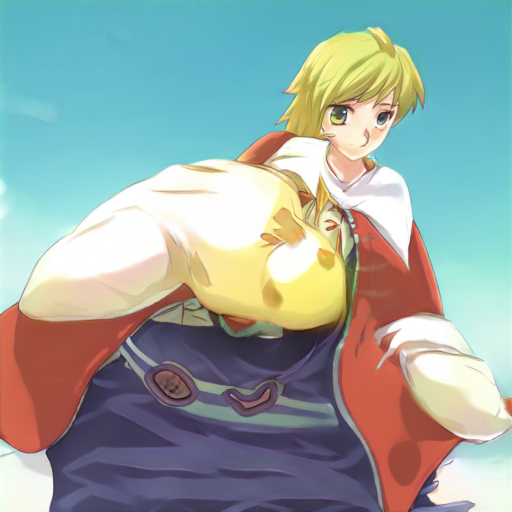

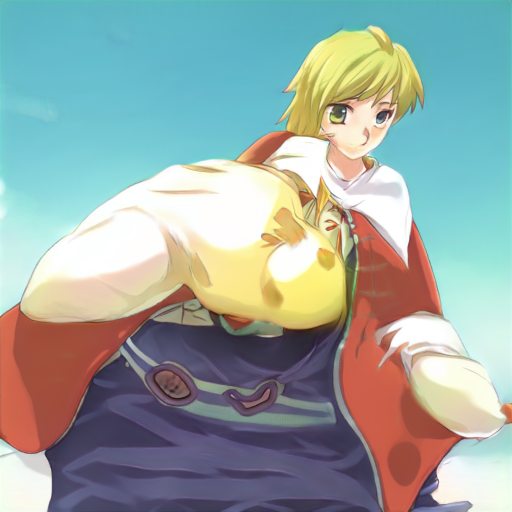

In [23]:
#verify that these images match
img=img_pt.cpu().numpy()[0]
display(fmtImg(img))
img = img_tf.cpu().numpy()[0]
display(fmtImg(img))

In [24]:
#and do we get the same output for D and disc?
device='cuda'

img=img_tf.cpu().numpy()
score0=_D.run(img,None)
disc.to(device)
with torch.no_grad():
    score1 = disc(
          torch.from_numpy(img).to(device)
    )
#verify that these scores match
print(score0,score1)

[[-3.69996]] tensor([[-3.7000]], device='cuda:0')


#Import CLIP

In [25]:
MODELS = {
    "ViT-B/32":       "https://openaipublic.azureedge.net/clip/models/40d365715913c9da98579312b702a82c18be219cc2a73407c4526f58eba950af/ViT-B-32.pt",
}

In [26]:
! wget {MODELS["ViT-B/32"]} -O model.pt

--2022-02-10 09:12:19--  https://openaipublic.azureedge.net/clip/models/40d365715913c9da98579312b702a82c18be219cc2a73407c4526f58eba950af/ViT-B-32.pt
Resolving openaipublic.azureedge.net (openaipublic.azureedge.net)... 13.107.246.39, 13.107.213.39, 2620:1ec:bdf::39, ...
Connecting to openaipublic.azureedge.net (openaipublic.azureedge.net)|13.107.246.39|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 353976522 (338M) [application/octet-stream]
Saving to: ‘model.pt’

model.pt            100%[===================>] 337.58M   196MB/s    in 1.7s    

2022-02-10 09:12:21 (196 MB/s) - ‘model.pt’ saved [353976522/353976522]



In [27]:
model = torch.jit.load("model.pt").cuda().eval()


In [28]:
input_resolution=clip_model.visual.input_resolution
vocab_size=vocab_size=clip_model.vocab_size
context_length=clip_model.context_length

model=clip_model


In [29]:
#model = torch.jit.load("model.pt").cuda().eval()
#model=clip_model
#input_resolution = model.input_resolution.item()
#context_length = model.context_length.item()
#vocab_size = model.vocab_size.item()

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

Model parameters: 427,616,513
Input resolution: 224
Context length: 77
Vocab size: 49408


## Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.



In [30]:
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
from PIL import Image

#preprocess = Compose([
#    Resize(input_resolution, interpolation=Image.BICUBIC),
#    CenterCrop(input_resolution),
#    ToTensor()
#])

#image_mean = torch.tensor([0.48145466, 0.4578275, 0.40821073]).cuda()
#image_std = torch.tensor([0.26862954, 0.26130258, 0.27577711]).cuda()


preprocess=clip_preprocess

## Text Preprocessing

We use a case-insensitive tokenizer. The tokenizer code is hidden in the second cell below

In [31]:
! pip install ftfy regex
! wget https://openaipublic.azureedge.net/clip/bpe_simple_vocab_16e6.txt.gz -O bpe_simple_vocab_16e6.txt.gz

--2022-02-10 09:12:25--  https://openaipublic.azureedge.net/clip/bpe_simple_vocab_16e6.txt.gz
Resolving openaipublic.azureedge.net (openaipublic.azureedge.net)... 13.107.246.39, 13.107.213.39, 2620:1ec:bdf::39, ...
Connecting to openaipublic.azureedge.net (openaipublic.azureedge.net)|13.107.246.39|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1356917 (1.3M) [application/octet-stream]
Saving to: ‘bpe_simple_vocab_16e6.txt.gz’

bpe_simple_vocab_16 100%[===================>]   1.29M  --.-KB/s    in 0.1s    

2022-02-10 09:12:25 (11.5 MB/s) - ‘bpe_simple_vocab_16e6.txt.gz’ saved [1356917/1356917]



In [32]:
#@title

import gzip
import html
import os
from functools import lru_cache

import ftfy
import regex as re


@lru_cache()
def bytes_to_unicode():
    """
    Returns list of utf-8 byte and a corresponding list of unicode strings.
    The reversible bpe codes work on unicode strings.
    This means you need a large # of unicode characters in your vocab if you want to avoid UNKs.
    When you're at something like a 10B token dataset you end up needing around 5K for decent coverage.
    This is a signficant percentage of your normal, say, 32K bpe vocab.
    To avoid that, we want lookup tables between utf-8 bytes and unicode strings.
    And avoids mapping to whitespace/control characters the bpe code barfs on.
    """
    bs = list(range(ord("!"), ord("~")+1))+list(range(ord("¡"), ord("¬")+1))+list(range(ord("®"), ord("ÿ")+1))
    cs = bs[:]
    n = 0
    for b in range(2**8):
        if b not in bs:
            bs.append(b)
            cs.append(2**8+n)
            n += 1
    cs = [chr(n) for n in cs]
    return dict(zip(bs, cs))


def get_pairs(word):
    """Return set of symbol pairs in a word.
    Word is represented as tuple of symbols (symbols being variable-length strings).
    """
    pairs = set()
    prev_char = word[0]
    for char in word[1:]:
        pairs.add((prev_char, char))
        prev_char = char
    return pairs


def basic_clean(text):
    text = ftfy.fix_text(text)
    text = html.unescape(html.unescape(text))
    return text.strip()


def whitespace_clean(text):
    text = re.sub(r'\s+', ' ', text)
    text = text.strip()
    return text


class SimpleTokenizer(object):
    def __init__(self, bpe_path: str = "bpe_simple_vocab_16e6.txt.gz"):
        self.byte_encoder = bytes_to_unicode()
        self.byte_decoder = {v: k for k, v in self.byte_encoder.items()}
        merges = gzip.open(bpe_path).read().decode("utf-8").split('\n')
        merges = merges[1:49152-256-2+1]
        merges = [tuple(merge.split()) for merge in merges]
        vocab = list(bytes_to_unicode().values())
        vocab = vocab + [v+'</w>' for v in vocab]
        for merge in merges:
            vocab.append(''.join(merge))
        vocab.extend(['<|startoftext|>', '<|endoftext|>'])
        self.encoder = dict(zip(vocab, range(len(vocab))))
        self.decoder = {v: k for k, v in self.encoder.items()}
        self.bpe_ranks = dict(zip(merges, range(len(merges))))
        self.cache = {'<|startoftext|>': '<|startoftext|>', '<|endoftext|>': '<|endoftext|>'}
        self.pat = re.compile(r"""<\|startoftext\|>|<\|endoftext\|>|'s|'t|'re|'ve|'m|'ll|'d|[\p{L}]+|[\p{N}]|[^\s\p{L}\p{N}]+""", re.IGNORECASE)

    def bpe(self, token):
        if token in self.cache:
            return self.cache[token]
        word = tuple(token[:-1]) + ( token[-1] + '</w>',)
        pairs = get_pairs(word)

        if not pairs:
            return token+'</w>'

        while True:
            bigram = min(pairs, key = lambda pair: self.bpe_ranks.get(pair, float('inf')))
            if bigram not in self.bpe_ranks:
                break
            first, second = bigram
            new_word = []
            i = 0
            while i < len(word):
                try:
                    j = word.index(first, i)
                    new_word.extend(word[i:j])
                    i = j
                except:
                    new_word.extend(word[i:])
                    break

                if word[i] == first and i < len(word)-1 and word[i+1] == second:
                    new_word.append(first+second)
                    i += 2
                else:
                    new_word.append(word[i])
                    i += 1
            new_word = tuple(new_word)
            word = new_word
            if len(word) == 1:
                break
            else:
                pairs = get_pairs(word)
        word = ' '.join(word)
        self.cache[token] = word
        return word

    def encode(self, text):
        bpe_tokens = []
        text = whitespace_clean(basic_clean(text)).lower()
        for token in re.findall(self.pat, text):
            token = ''.join(self.byte_encoder[b] for b in token.encode('utf-8'))
            bpe_tokens.extend(self.encoder[bpe_token] for bpe_token in self.bpe(token).split(' '))
        return bpe_tokens

    def decode(self, tokens):
        text = ''.join([self.decoder[token] for token in tokens])
        text = bytearray([self.byte_decoder[c] for c in text]).decode('utf-8', errors="replace").replace('</w>', ' ')
        return text


#Gradient Descent
We calculate a score based off of:
1. Clip score for the description string
2. Discriminator score from TADNE
3. Regularize, since TADNE expects inputs that are unit normal

In [33]:
from tqdm.notebook import tqdm, trange

In [34]:
_preprocess = torch.nn.Sequential(
    Resize(input_resolution, interpolation=Image.BICUBIC),
    CenterCrop(input_resolution),
)


In [35]:
print(clip_preprocess)

print(_preprocess)

Compose(
    Resize(size=224, interpolation=PIL.Image.BICUBIC)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7f8bbdd7fd40>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Sequential(
  (0): Resize(size=224, interpolation=PIL.Image.BICUBIC)
  (1): CenterCrop(size=(224, 224))
)


In [36]:
_preprocess = torch.nn.Sequential(
    Resize(input_resolution, interpolation=Image.BICUBIC),
    CenterCrop(input_resolution),
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

In [37]:
print(clip_preprocess)

print(_preprocess)

Compose(
    Resize(size=224, interpolation=PIL.Image.BICUBIC)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7f8bbdd7fd40>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Sequential(
  (0): Resize(size=224, interpolation=PIL.Image.BICUBIC)
  (1): CenterCrop(size=(224, 224))
  (2): Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)


In [38]:
def getScoringFunction(description,phi=1.0,regularization=-0.01/1024,discriminatorWeight=0.001):
  #preprocess text
  #texts=[description]  
  #tokenizer = SimpleTokenizer()
  #text_tokens = [tokenizer.encode("This is " + desc) for desc in texts]
  #text_input = torch.zeros(len(text_tokens), model.context_length, dtype=torch.long)
  #for i, tokens in enumerate(text_tokens):
  #    text_input[i, :len(tokens)] = torch.tensor(tokens)
  #text_input = text_input.cuda()

  text_features=clip_model.encode_text(clip.tokenize(description).to(device)).float()

  #this function takes a (latent) as input and returns a PIL image
  # latents can be generated using 
  # latent = np.random.RandomState(seed).randn(1, 1024)
  def displayLatent(latent,phi=phi):
    with torch.no_grad():
      img_pt, _ = g(
          [torch.from_numpy(latent).to(device)],
          truncation=phi,
          truncation_latent=latent_avg.to(device),
          randomize_noise=False,
      )
    img=img_pt.cpu().numpy()[0]
    return fmtImg(img)
  
  #this function takes a latent and returns a score and a derivative
  def scoreLatent(latent,phi=phi,regularization=regularization,discriminatorWeight=discriminatorWeight):
    with torch.no_grad():
      _latent=torch.from_numpy(latent).to(device)
      #compute img array from latent
      img_pt, _ = g(
          [_latent],
          truncation=phi,
          truncation_latent=latent_avg.to(device),
          randomize_noise=False,
      )
      #pass through CLIP
      image_input = _preprocess(img_pt)
      image_features = model.encode_image(image_input).float()
      #text_features = model.encode_text(text_input).float()    
      #cosine
      image_features_n= image_features/image_features.norm(dim=-1, keepdim=True)
      text_features_n=text_features/text_features.norm(dim=-1, keepdim=True)
      similarity = text_features_n @ image_features_n.T
      #clip score is just the similarity
      clipScore=similarity.sum()
      #discriminator
      discScore=disc(img_pt)
      #regularization
      l2reg=(_latent**2).sum()
      loss=l2reg*regularization-discScore*discriminatorWeight-clipScore
    score=loss.cpu().numpy().flatten()[0][0]
    return score

  def scoreLatent3(latent,phi=phi,regularization=regularization,discriminatorWeight=discriminatorWeight):
    with torch.no_grad():
      _latent=torch.from_numpy(latent).to(device)
      #compute img array from latent
      img_pt, _ = g(
          [_latent],
          truncation=phi,
          truncation_latent=latent_avg.to(device),
          randomize_noise=False,
      )
      #pass through CLIP
      image_input = _preprocess(img_pt)
      image_features = model.encode_image(image_input).float()
      #text_features = model.encode_text(text_input).float()    
      #cosine
      image_features_n= image_features/image_features.norm(dim=-1, keepdim=True)
      text_features_n=text_features/text_features.norm(dim=-1, keepdim=True)
      similarity = text_features_n @ image_features_n.T
      #clip score is just the similarity
      clipScore=similarity.sum()
      #discriminator
      discScore=disc(img_pt)
      #regularization
      l2reg=(_latent**2).sum()
      loss=l2reg*regularization-discScore*discriminatorWeight-clipScore
    return clipScore.cpu().item(),discScore.cpu().numpy()[0][0],l2reg.cpu().item(),loss.cpu().item()

  #this function takes a latent and returns a score and a derivative
  def gradientDescent(latent,nSteps,phi=phi,regularization=regularization,discriminatorWeight=discriminatorWeight,lr=0.01):

    _latent=torch.from_numpy(latent).to(device)
    _latent.requires_grad=True

    #optim=torch.optim.Adam([_latent], lr=lr)
    #optim=torch.optim.SGD([_latent], lr=lr)
    optim=torch.optim.AdamW([_latent])

    for step in range(nSteps):
      #clear gradient
      optim.zero_grad()
      #compute img array from latent
      img_pt, _ = g(
          [_latent],
          truncation=phi,
          truncation_latent=latent_avg.to(device),
          randomize_noise=False,
      )
      #send through CLIP
      image_input = _preprocess(img_pt)
      image_features = model.encode_image(image_input).float()
      #text_features = model.encode_text(text_input).float()      
      #compute CosDistance
      image_features_n= image_features/image_features.norm(dim=-1, keepdim=True)
      text_features_n=text_features/text_features.norm(dim=-1, keepdim=True)
      similarity = text_features_n @ image_features_n.T
      #appy loss
      #clip score is just the similarity
      clipScore=similarity.sum()
      #discriminator
      discScore=disc(img_pt)
      #regularization
      l2reg=(_latent**2).sum()
      loss=l2reg*regularization-discScore*discriminatorWeight-clipScore
      #compute gradient
      loss.backward()
      #step optimizer
      if step<nSteps-1:
        optim.step()
    score=loss.detach().cpu().numpy()[0][0]
    
    return score,_latent.detach().cpu().numpy()

  return scoreLatent3,displayLatent,gradientDescent

In [39]:
def searchAndClimb(description,n,k,t,phi=1.0,regularization=0.005/1024,discriminatorWeight=0.001,show=False):
  '''
  First generate n examples and score them
   then take the top k scoring examples and run t steps of hill-climbing
  '''
  #generate scoring function
  scoreLatent3,displayLatent,gradientDescent=getScoringFunction(description,phi=1.0,regularization=0.005/1024,discriminatorWeight=0.001)
  #generate n results and take the top k
  latents=[]
  scores=[]
  for i in trange(n):
    latent = np.random.RandomState().randn(1, 1024).astype("float32")
    score=scoreLatent3(latent)[-1]
    scores+=[score]
    latents+=[latent]
  topK=np.argsort(scores)[:k]
  #run hill climbing t steps on winning
  results=[]
  for i in trange(k):
    _score,_result=gradientDescent(latents[topK[i]],t,lr=0.07)
    results+=[(_result,_score)]
    if show:
      print(i,scores[topK[i]],scoreLatent3(_result))
      display(displayLatent(_result))
  return results


#and now we can finally do the search
The main variables to tweak are:
0. description, the string to search for
1. n, the number of inital latents to test
2. k, the number of "top" latents to pass to hill climbing stage
3. t, the number of hill-climbing steps to take

Also, if show=True, it will print out the score and display image for
 each of the top k results


In [40]:
def displayLatent(latent,phi=1.0):
    with torch.no_grad():
      img_pt, _ = g(
          [torch.from_numpy(latent).to(device)],
          truncation=1.0,
          truncation_latent=latent_avg.to(device),
          randomize_noise=False,
      )
    img=img_pt.cpu().numpy()[0]
    return fmtImg(img)

In [41]:
def showResults(results):
  img = PIL.Image.fromarray(np.hstack([np.array(displayLatent(r)) for (r,s) in results]), 'RGB')
  return img

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

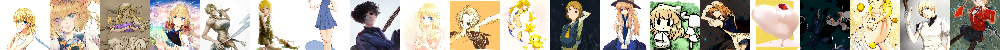

In [42]:
results=searchAndClimb("princess diana",5000,20,200)
showResults(results)

In [43]:
red=getScoringFunction("an anime drawing of a woman with red hair")
white=getScoringFunction("an anime drawing of a woman with white hair")
blue=getScoringFunction("an anime drawing of a woman with blue hair")
yellow=getScoringFunction("an anime drawing of a woman with blonde hair")
black=getScoringFunction("an anime drawing of a woman with black hair")

In [44]:
sfns=[red,white,blue,yellow,black]

In [45]:
scores=[[sfns[i][0](results[j][0])[0] for i in range(5)] for j in trange(5)]

  0%|          | 0/5 [00:00<?, ?it/s]

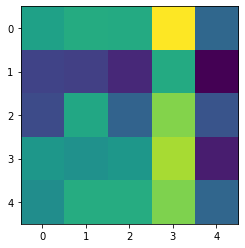

In [46]:
plt.imshow(scores)